In this Notebook I train with a temporal range of images and then I predict them. Then I compare the differences between the original arrays and the predicted. I differenciate the images in 8 clusters. And I iterate over different number of neurons, and activation functions to select the best combination.

# Libraries

In [1]:
'''Main'''
import numpy as np
import pandas as pd
import os, time, re
import pickle, gzip
from random import randint
import math
import re

'''Data Viz'''
import matplotlib.pyplot as plt
from matplotlib.pyplot import hist
import matplotlib.cm as cm
import seaborn as sns
color = sns.color_palette()
import matplotlib as mpl

%matplotlib inline

'''Data Prep and Model Evaluation'''
from sklearn import preprocessing as pp
from sklearn.metrics import mean_squared_error
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import train_test_split 
from sklearn.model_selection import StratifiedKFold 
from sklearn.metrics import log_loss
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
import joblib 

'''Algos'''
#import lightgbm as lgb

'''TensorFlow and Keras'''
import tensorflow as tf
import keras
from keras import backend as K
from keras.models import Sequential, Model, load_model
from keras.layers import Activation, Dense, Dropout
from keras.layers import BatchNormalization, Input, Lambda
from keras import regularizers
from keras.losses import mse, binary_crossentropy

from osgeo import gdal
from osgeo import gdal_array
import matplotlib.pyplot as plt
import numpy as np
import sys
from osgeo.gdalconst import *
import os

import math
import codecs

import osgeo #this is necessary for the type comparison in some methods
from osgeo import osr
from osgeo import ogr
from collections import defaultdict
import itertools
from osgeo import gdal_array as gdar
from osgeo import gdalconst as gdct
import glob

# Inputs

In [2]:
path_images = '/Users/clara/Projects/A4_Cube/Images/Strobler/'
bands = ['Cloud','B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B9', 'B10', 'B11', 'B12']
model_filepath = '/Users/clara/Projects/A4_Cube/Codes/Strobler/tun/Models/'
figures_filepath = '/Users/clara/Projects/A4_Cube/Codes/Strobler/tun/Figures/'
dataframes_filepath = '/Users/clara/Projects/A4_Cube/Codes/Strobler/tun/Dataframes/'
n_pixels = 1
n_clusters = 8

# Data from .tif images

**UPLOAD TIFF AND CUSTOMIZE ARRAY**

In [3]:
def is_leap_year(year):
    """ if year is a leap year return True
        else return False """
    if year % 100 == 0:
        return year % 400 == 0
    return year % 4 == 0

def doy(Y,M,D):
    """ given year, month, day return day of year
        Astronomical Algorithms, Jean Meeus, 2d ed, 1998, chap 7 """
    if is_leap_year(Y):
        K = 1
    else:
        K = 2
    N = int((275 * M) / 9.0) - K * int((M + 9) / 12.0) + D - 30
    return N

In [4]:
#Train
trainArray = []
ymds = []
doys = []

files = sorted(os.listdir(path_images))
for f in files:
    if not f.startswith(('.', 'm')) and f.endswith(('.tif')) and os.path.isfile(os.path.join(path_images, f)):
        # Bands
        tif = gdal_array.LoadFile(path_images+f)
        tif = np.delete(tif, 0, axis=0)
        tif = np.delete(tif, 10, axis=0)
        tif = tif/6000
        
        # DOY: t1, t2
        Y_M_D = re.sub("[^0-9]", "", f)
        ymds.append(Y_M_D)
        d = doy(int(Y_M_D[-4:]),int(Y_M_D[2:4]),int(Y_M_D[:2]))
        doys.append(d)
        t1 = np.full((tif.shape[1], tif.shape[2]), (np.sin(d*2*np.pi/365)+1)/2)
        t2 = np.full((tif.shape[1], tif.shape[2]), (np.cos(d*2*np.pi/365)+1)/2)
        t1_t2 = np.stack([t1, t2], axis=0)
        
        # Join
        tif = np.concatenate([tif, t1_t2], axis=0)
        print(tif.shape)
        trainArray.append(tif)

trainArray = np.stack(trainArray, axis = 0)

print(f'''-> Files:
{files}''')
print(f'-> Dates: {ymds}')
print(f'-> DOYs: {doys}')
print(f'-> tifArray shape: {trainArray.shape}')

(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
(14, 193, 354)
-> Files:
['.DS_Store', 'Strobbler_clean_Image_01042017.tif', 'Strobbler_clean_Image_01042017.tif.aux.xml', 'Strobbler_clean_Image_02082017.tif', 'Strobbler_clean_Image_02082017.tif.aux.xml', 'Strobbler_clean_Image_04082018.tif', 'Strobbler_clean_Image_04082018.tif.aux.xml', 'Strobbler_clean_Image_05072017.ti

In [5]:
bands = ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B9', 'B11', 'B12', 't1', 't2']

# True color composite

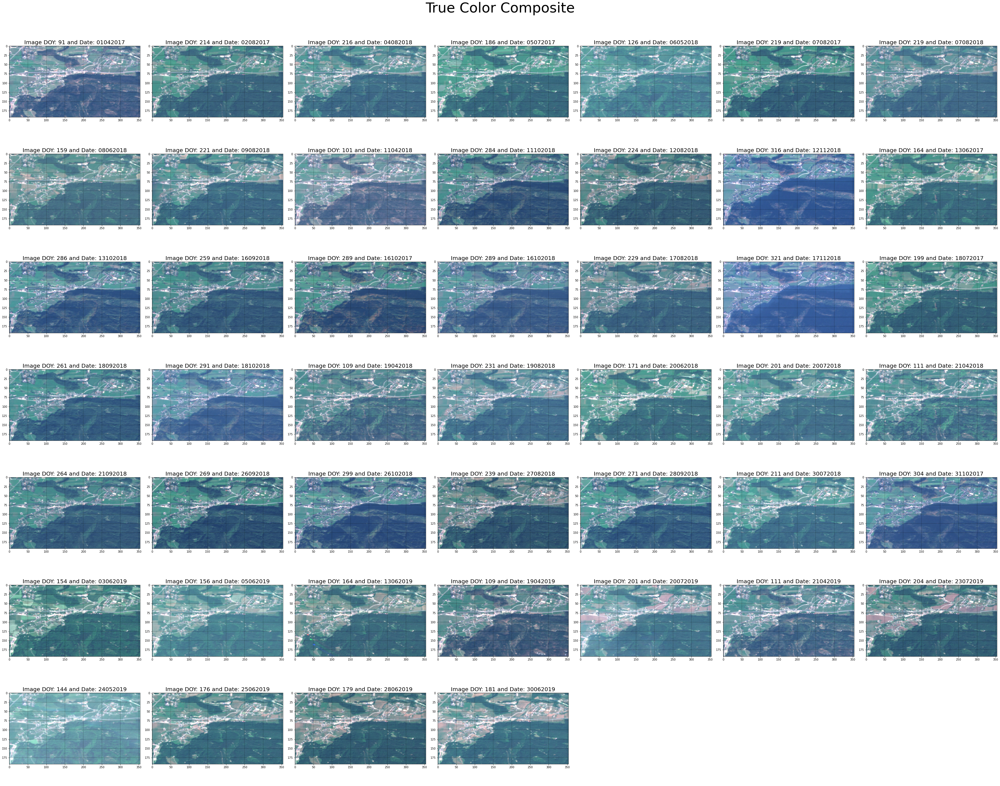

In [6]:
# Fill in number of figures:
n_figures = trainArray.shape[0]

# Prepare subplots
n_rows = int(math.ceil((n_figures)**(1/2)))
n_cols = int(math.ceil(n_figures/n_rows))
rows=[]
columns = []
for row in range(n_rows):
    for col in range(n_cols):
        rows.append(row)
        columns.append(col)

# Subplots and figure title
fig, axs = plt.subplots(n_rows, n_cols, figsize= (50,40))
fig.suptitle(f'True Color Composite', fontsize = 50)

# Plot images
for sp in range(n_figures):
    image = trainArray[sp]
    img = np.dstack((image[3, ...]*4, image[2, ...]*4, image[1, ...]*4))
    img = np.clip(img, 0, 1)
    ax = axs[rows[sp], columns[sp]]
    img = ax.imshow(np.array(img))
    ax.grid(color='black', linewidth=0.3)
    ax.set_title(f'Image DOY: {doys[sp]} and Date: {ymds[sp]}', fontsize=20)

# delete empty figures
for image in range(n_figures, n_rows*n_cols):
    axs[rows[image], columns[image]].set_axis_off()

# save
plt.tight_layout()
fig.subplots_adjust(top=0.95)
plt.savefig(f'{figures_filepath}/original_images.png', format='png', dpi=300)
plt.show()

# Image selection

In [7]:
# Delete images
img_cloud = [4, 2, 17, 19, 22, 30, 34, 36, 42]
trainArray = np.delete(trainArray, img_cloud, axis=0)
shape=trainArray.shape
print(f'shape: {shape}')

shape: (37, 14, 193, 354)


In [8]:
doys = list(np.delete(np.array(doys), img_cloud, axis = 0))
len(doys)

37

# Prepare data for AE and Clustering

**CLUSTERING**

In [9]:
array_kmeans = trainArray[:,:-2, :,:]
array_kmeans = np.transpose(array_kmeans.reshape(array_kmeans.shape[0]*array_kmeans.shape[1], array_kmeans.shape[2]*array_kmeans.shape[3]))
array_kmeans.shape

(68322, 444)

**PREDICT TRAINING**

In [10]:
# Reshape: images, bands, rows*columns
TRAINarray_ae = trainArray.reshape(trainArray.shape[0], trainArray.shape[1], trainArray.shape[2]*trainArray.shape[3])
# Join per images: bands, images*rows*columns
TRAINarray_ae = np.concatenate(TRAINarray_ae, axis=1)
# Transpose: images*rows*columns, bands
TRAINarray_ae = TRAINarray_ae.transpose()
TRAINarray_ae.shape

(2527914, 14)

# Clustering

In [11]:
# Train K-means
n_features = array_kmeans.shape[1]
print('Training the algorithm...')
start = time.time()
means = KMeans(n_clusters=n_clusters, n_init = 20, random_state = 1996).fit(array_kmeans)
end = time.time()
print(f'--- minutes ---- {(end - start)/60}')

Training the algorithm...
--- minutes ---- 0.8603487173716228


In [12]:
labels = means.labels_.reshape(trainArray.shape[2], trainArray.shape[3])

<Figure size 432x288 with 0 Axes>

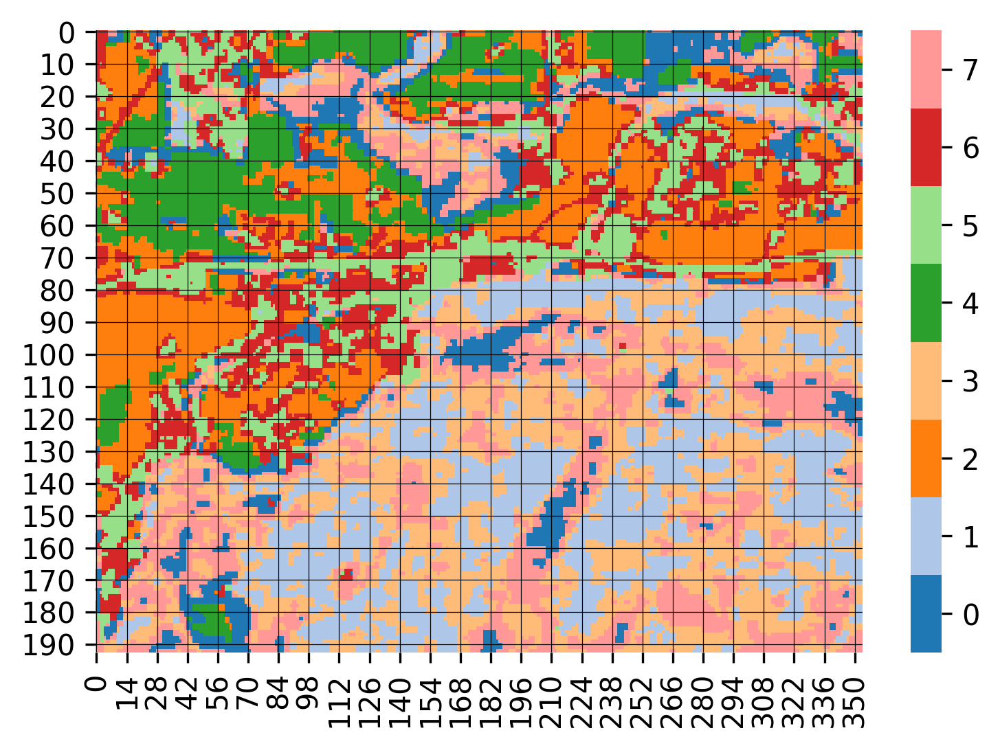

In [13]:
plt.figure()
# discrete colormap (n samples from a given cmap)
cmap = sns.color_palette('tab20', n_clusters) 
fig, ax = plt.subplots(dpi=300) 
ax = sns.heatmap(labels, cmap=cmap) 
# modify colorbar:
colorbar = ax.collections[0].colorbar 
r = colorbar.vmax - colorbar.vmin 
colorbar.set_ticks([colorbar.vmin + r / n_clusters * (0.5 + i) for i in range(n_clusters)])
colorbar.set_ticklabels(list(range(n_clusters)))
plt.grid(color='black', linewidth=0.3)
plt.savefig(f'{figures_filepath}/clusters.png', format='png', dpi=300)
plt.show()

# Get training pixels

**REPRESENTATIVENESS OF EACH PIXEL TO ITS CLUSTER**

Shape: (193, 354)


<Figure size 432x288 with 0 Axes>

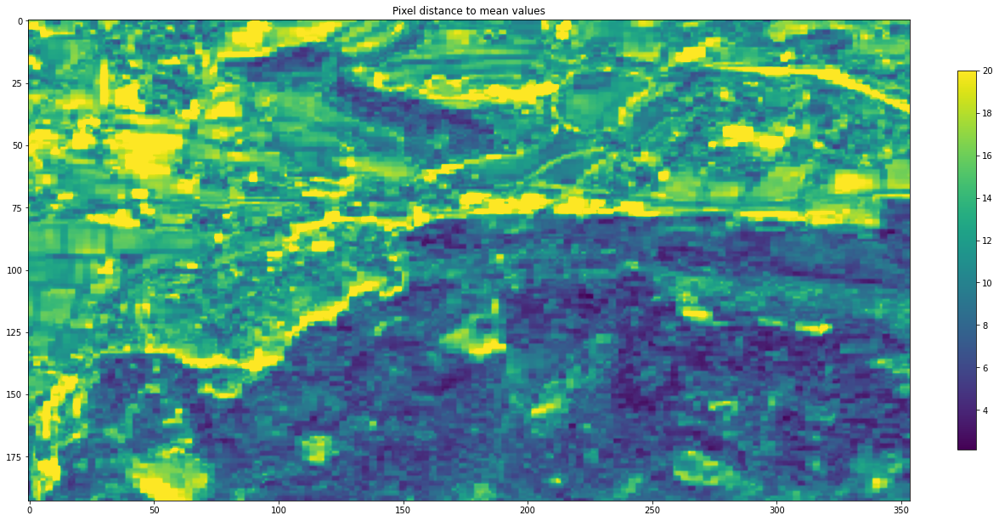

In [14]:
plt.figure()
# reshape to only bands
band_axis = np.concatenate(trainArray, axis=0)

# calculate sum of the difference per pixel to the mean of each band in its cluster
represent = []
for c in range(n_clusters):
    # select cluster
    cluster = band_axis*(labels == c)
    # difference to the mean per band
    diff_bands = []
    for b in cluster:
        diff = abs(b - np.full((trainArray.shape[2], trainArray.shape[3]), (np.sum(b)/np.count_nonzero(b)))*(labels == c))
        diff_bands.append(diff)
    diff_bands = np.array(diff_bands)

    # sum of the differences for all bands
    cluster_diff_bands = np.sum(diff_bands, axis=0)
    represent.append(cluster_diff_bands)

# Join all clusters for representation
represent = np.sum(np.array(represent), axis=0)
print(f'Shape: {represent.shape}')

# represent values
plt.figure(figsize=(20,20))
plt.imshow(represent, vmax=20)
plt.title('Pixel distance to mean values')
plt.colorbar(fraction=0.02)
plt.savefig(f'{figures_filepath}/pixel_representativity.png', format='png', dpi=300)
plt.show()

**SELECTION OF MOST REPRESENTATIVE PIXELS**

In [15]:
n_pixels = n_pixels
rep_pix_allCluster = []
for c in range(n_clusters):
    cluster = represent*(labels == c)
    print('---------------------------------------------------------------------------------------')
    print(f'Cluster: {c}')
    print('---------------------------------------------------------------------------------------')
    rep_pix_cluster = []
    for i in range(n_pixels):
        minval = np.nanmin(cluster[np.nonzero(cluster)])
        print(f'Min difference: {minval}')
        pixel = [(ix,iy) for ix, row in enumerate(cluster) for iy, i in enumerate(row) if i == minval][0]
        rep_pix_cluster.append(pixel)
        print(f'Pixel {i}: {pixel}')
        cluster[pixel[0]][pixel [1]] = 0
    print(f'Pixel Locations: {rep_pix_cluster}')
    rep_pix_allCluster.append(rep_pix_cluster)

---------------------------------------------------------------------------------------
Cluster: 0
---------------------------------------------------------------------------------------
Min difference: 6.089115100943813
Pixel 0: (103, 187)
Pixel Locations: [(103, 187)]
---------------------------------------------------------------------------------------
Cluster: 1
---------------------------------------------------------------------------------------
Min difference: 2.1302900953608823
Pixel 0: (110, 224)
Pixel Locations: [(110, 224)]
---------------------------------------------------------------------------------------
Cluster: 2
---------------------------------------------------------------------------------------
Min difference: 6.15640290758048
Pixel 0: (95, 38)
Pixel Locations: [(95, 38)]
---------------------------------------------------------------------------------------
Cluster: 3
---------------------------------------------------------------------------------------
Min 

**GET TRAINING DATA**

In [16]:
training_data = []
for b in range(len(bands)):
    data = []
    label_data = []
    for cluster in range(n_clusters):
        data_cluster = []
        name = f'Cluster {cluster}'
        label_data.append(name)
        pixels = rep_pix_allCluster[cluster]
        for img in range(trainArray.shape[0]):
            for pixel in pixels:
                pixel = trainArray[img, b, pixel[0], pixel[1]]
                data_cluster.append(pixel)
        data.append(data_cluster)
    training_data.append(data)
training_data = np.array(training_data)
print('bands, clusters, images x pixels')
print(training_data.shape)

bands, clusters, images x pixels
(14, 8, 37)


---------------------------------------------------------------------------------------------------------

# Autoencoder Tunning

In [20]:
n_iterations = 10
neurons = list(range(1, trainArray.shape[1]))
activation_functions = ['linear', 'relu', 'sigmoid', 'softmax', 'softplus', 'softsign', 'tanh', 'selu', 'elu', 'exponential']

In [28]:
mean_timeAE = 1.1
repetitions = n_iterations * len(neurons) * len(activation_functions)
aproxTime = mean_timeAE * repetitions
print(f'Aprox hours: {aproxTime/60}')

Aprox hours: 23.833333333333336


In [25]:
# early stopping
es = keras.callbacks.EarlyStopping(monitor = 'mse', mode = 'min', min_delta = 0.001, verbose = 2, patience = 12) 

# lists
aes = []
ns = []
afs = []
ites = []
rmss = []

# tunning
for ae in list(range(n_clusters)):
    
    # training data
    data = np.transpose(training_data[:, ae, :])
    
    # autoencoder, prediction AND error
    for n in neurons:
        for af in activation_functions:
            for ite in range(n_iterations):
                
                start = time.time()
                
                # Print
                print(f'''
                ----------------------------------------------------------------------------------------------
                AUTOENCODER: {ae}, NUMBER NEURONS: {n}, ACTIVATION FUNCTION: {af}, NUMBER ITERATION: {ite}
                ----------------------------------------------------------------------------------------------
                ''')

                # Create model
                model = Sequential()

                # Create layers
                model.add(Dense(units=n, activation=af, input_dim=trainArray.shape[1]))
                model.add(Dense(units=trainArray.shape[1], activation=af))

                # Compile model (a traditional default value for the learning rate is 0.1 or 0.01)
                opt = keras.optimizers.Adam(learning_rate=0.001)
                tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")
                model.compile(optimizer=opt, loss="mean_squared_error", metrics=['mse'])

                # Train
                print('Training...')
                X_train, X_test = train_test_split(data, test_size=0.2, random_state=1)
                history = model.fit(x=X_train, y=X_train,
                                    epochs=150,
                                    batch_size= None,
                                    shuffle=True,
                                    validation_data=(X_test,X_test),
                                    verbose=0,
                                    callbacks=[es])
                
                # Predict and reshape
                print('Predicting')
                TRAINpredicted_or = model.predict(x=TRAINarray_ae, verbose=1)
                
                # Calculate rmse
                rms = round(mean_squared_error(TRAINarray_ae, TRAINpredicted_or, squared=False),6)
                print(f'RMS: {rms}')
                
                # Save data
                aes.append(ae)
                ns.append(n)
                afs.append(af)
                ites.append(ite)
                rmss.append(rms)
                
                # Time
                end = time.time()
                print(f'Running time in minutes ----{(end-start)/60}')


                ----------------------------------------------------------------------------------------------
                AUTOENCODER: 0, NUMBER NEURONS: 1, ACTIVATION FUNCTION: linear, NUMBER ITERATION: 0
                ----------------------------------------------------------------------------------------------
                
Training...
Predicting
78998/78998 [==============================] - 57s 718us/step
0.179
Running time in minutes ----1.0916915933291118

                ----------------------------------------------------------------------------------------------
                AUTOENCODER: 0, NUMBER NEURONS: 1, ACTIVATION FUNCTION: linear, NUMBER ITERATION: 1
                ----------------------------------------------------------------------------------------------
                
Training...
Predicting
78998/78998 [==============================] - 56s 713us/step
0.16
Running time in minutes ----1.0585966507593791

                ----------------------------

KeyboardInterrupt: 

In [ ]:
# Create dataframe with results
tunning = pd.DataFrame({
    'AE': aes,
    'NumberNeurons' : ns,
    'ActivationFunction' : afs,
    'Iteration' : ites,
    'RMSE' : rmss
})

In [ ]:
tunning.to_csv()

# Import results

In [25]:
tunning = pd.read_csv(f'{dataframes_filepath}tunning1.csv')
del tunning['Unnamed: 0']
tunning

,AE,NumberNeurons,ActivationFunction,Iteration,RMSE
0,0,1,linear,0,0.191176
1,0,1,linear,1,0.163058
2,0,1,linear,2,0.142447
3,0,1,linear,3,0.174651
4,0,1,linear,4,0.154268
...,...,...,...,...,...
10395,7,13,exponential,5,0.623886
10396,7,13,exponential,6,0.301807
10397,7,13,exponential,7,0.457102
10398,7,13,exponential,8,0.434281


- **Mean, min and max iterations**

# Plot results

- **AEs**

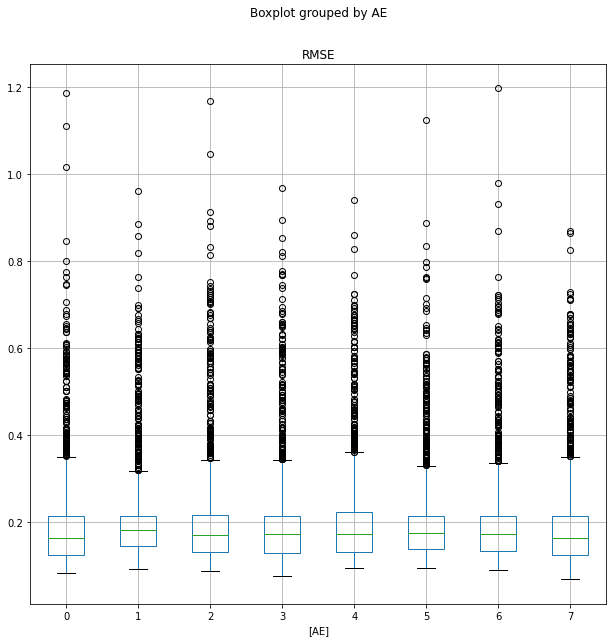

In [41]:
aes = tunning[['AE', 'RMSE']].copy()
aes_boxplot = aes.boxplot(by='AE', figsize = (10,10))
plt.savefig(f'{figures_filepath}/BoxPlot_RMSE_AE.png', format='png', dpi=300)

- **Number neurons**

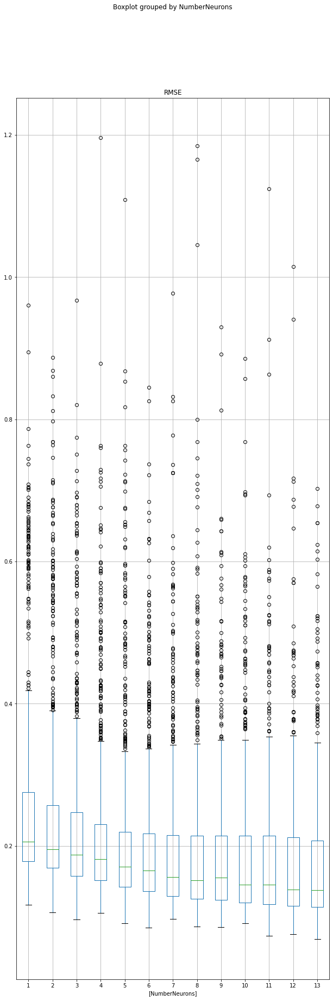

In [42]:
numneurons = tunning[['NumberNeurons', 'RMSE']].copy()
numneurons_boxplot = numneurons.boxplot(by='NumberNeurons', figsize = (10,30))
plt.savefig(f'{figures_filepath}/BoxPlot_RMSE_NumberNeurons.png', format='png', dpi=300)

- **Activation Function**

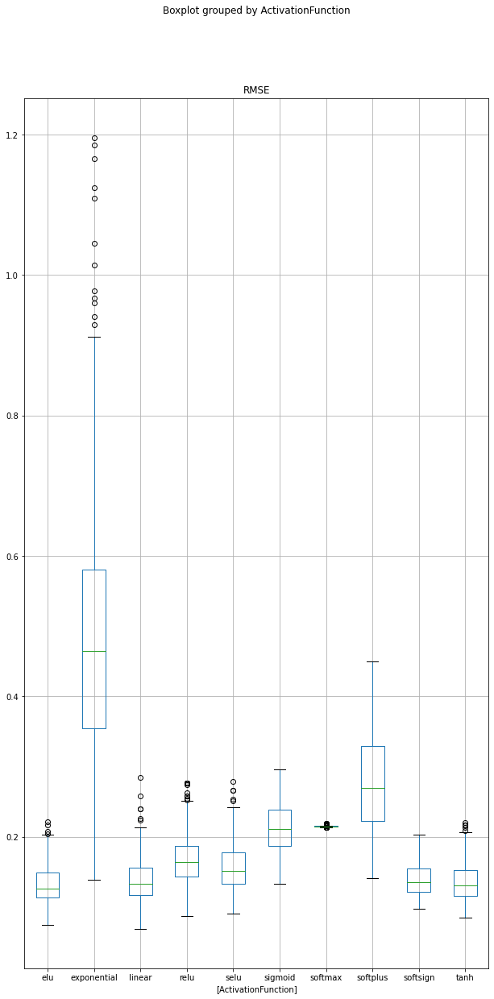

In [43]:
actfun = tunning[['ActivationFunction', 'RMSE']].copy()
actfun_boxplot = actfun.boxplot(by='ActivationFunction', figsize = (10,20))
plt.savefig(f'{figures_filepath}/BoxPlot_RMSE_ActivationFunction.png', format='png', dpi=300)

# Best combinations

No he tenido en cuenta sacar la media de las 10 iteraciones que hay por combinación

In [39]:
for ae in range(n_clusters):
    ae_df = tunning[(tunning['AE'] == ae)]
    print(ae_df[ae_df.RMSE == ae_df.RMSE.min()])

      AE  NumberNeurons ActivationFunction  Iteration      RMSE
1189   0             12                elu          9  0.083667
      AE  NumberNeurons ActivationFunction  Iteration      RMSE
2405   1             12             linear          5  0.092385
      AE  NumberNeurons ActivationFunction  Iteration      RMSE
3809   2             13             linear          9  0.087546
      AE  NumberNeurons ActivationFunction  Iteration      RMSE
5007   3             12             linear          7  0.076008
      AE  NumberNeurons ActivationFunction  Iteration      RMSE
6100   4             10             linear          0  0.095896
      AE  NumberNeurons ActivationFunction  Iteration      RMSE
7689   5             12                elu          9  0.095583
      AE  NumberNeurons ActivationFunction  Iteration      RMSE
8904   6             12             linear          4  0.089238
       AE  NumberNeurons ActivationFunction  Iteration      RMSE
10303   7             13             li

# End